<a href="https://colab.research.google.com/github/pirumba/computer_vision/blob/main/annotatedmodel.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Install Dependencies**

In [1]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

fatal: destination path 'yolov5' already exists and is not an empty directory.
/content/yolov5
Setup complete. Using torch 1.12.1+cu113 (Tesla T4)


**Step 2: Assemble Our Dataset**
In order to train our custom model, we need to assemble a dataset of representative images with bounding box annotations around the objects that we want to detect. And we need our dataset to be in YOLOv5 format.

In Roboflow, you can choose between two paths:

Convert an existing dataset to YOLOv5 format. Roboflow supports over 30 formats object detection formats for conversion.
Upload raw images and annotate them in Roboflow with Roboflow Annotate.

In [2]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [3]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/drive/MyDrive/YOLO"

In [4]:
# #after following the link above, recieve python code with these fields filled in
# #from roboflow import Roboflow
# #rf = Roboflow(api_key="YOUR API KEY HERE")
# #project = rf.workspace().project("YOUR PROJECT")
# #dataset = project.version("YOUR VERSION").download("yolov5")
# # !pip install roboflow
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="Mwu3QmrQ1Xs3zTjSBiQB")
project = rf.workspace("cropannotation").project("crops-ifvld")
dataset = project.version(3).download("yolov5")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/drive/MyDrive/YOLO/crops-3 in yolov5pytorch:: 100%|██████████| 392/392 [00:02<00:00, 146.23it/s]


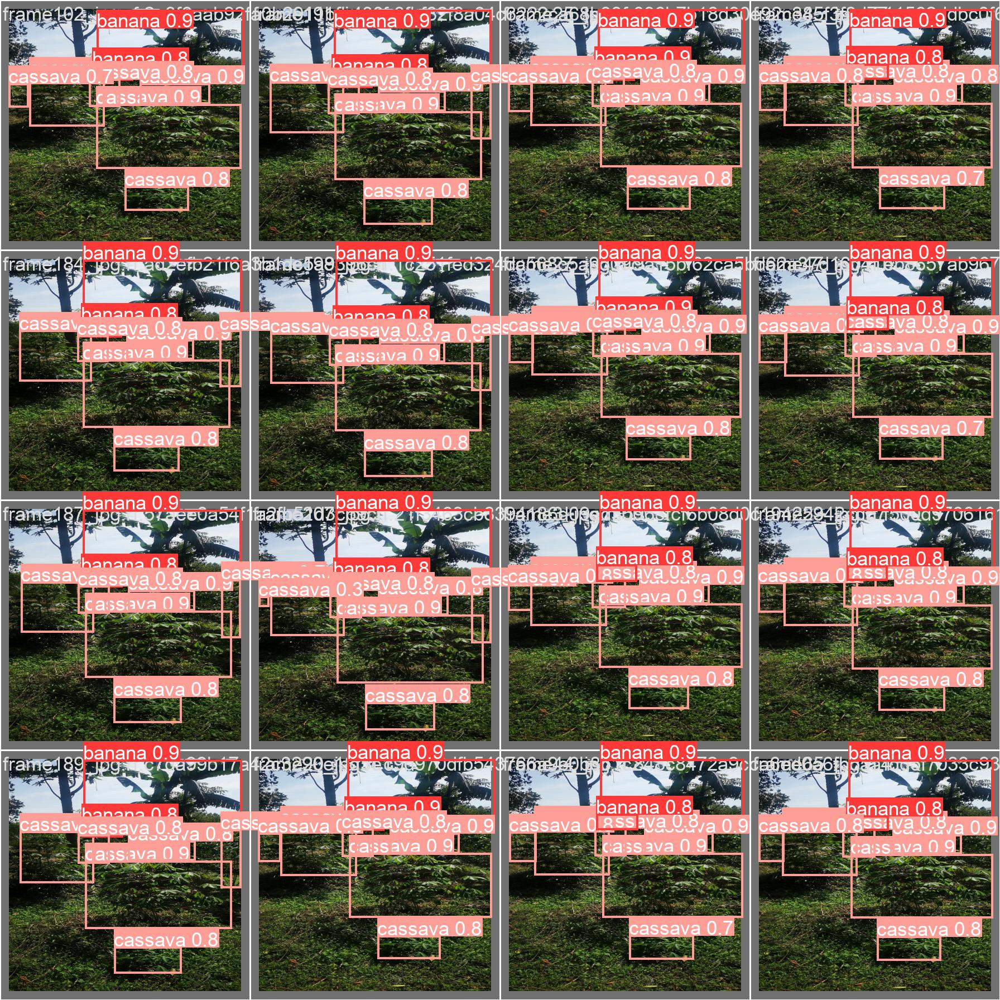

In [5]:
Image(filename = '/content/yolov5/runs/train/exp/val_batch0_pred.jpg', width =1000)

In [6]:
# from google.colab import drive
# drive.mount('/content/drive')

In [7]:
# from google.colab import drive
# drive.mount('/content/drive')

**Step 3: Train Our Custom YOLOv5 model**
Here, we are able to pass a number of arguments:

img: define input image size
batch: determine batch size
epochs: define the number of training epochs. (Note: often, 3000+ are common here!)
data: Our dataset locaiton is saved in the dataset.location
weights: specify a path to weights to start transfer learning from. Here we choose the generic COCO pretrained checkpoint.
cache: cache images for faster training

In [8]:
!python train.py --img 416 --batch 16 --epochs 100 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/drive/MyDrive/YOLO/crops-3/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-187-g5ef69ef Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, h

In [9]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [10]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/drive/MyDrive/YOLO/crops-3/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-187-g5ef69ef Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/19 /content/drive/MyDrive/YOLO/crops-3/test/images/frame105_jpg.rf.0048f7fdde5064aec53907358eba5223.jpg: 416x416 2 bananas, 7 cassavas, 8.2ms
image 2/19 /content/drive/MyDrive/YOLO/crops-3/test/images/frame112_jpg.rf.5bd74d6a66ffa1e3ded7b6036b53aa2f.jpg: 416x416 2 bananas, 7 cassavas, 8.2ms
image 3/19 /content

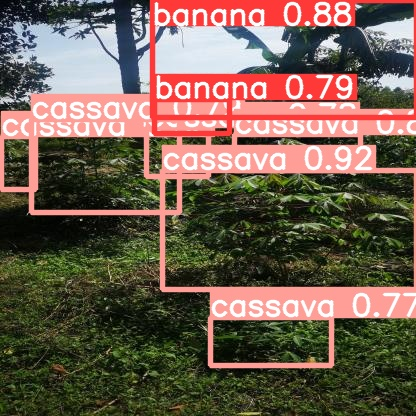

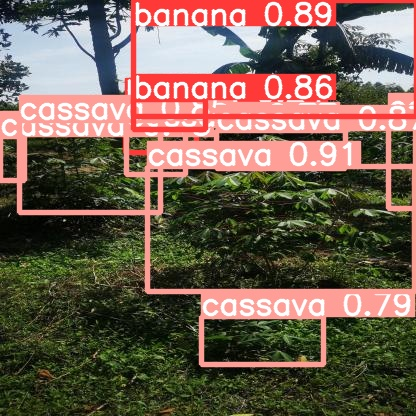

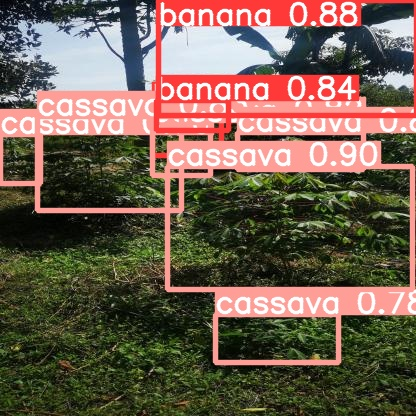

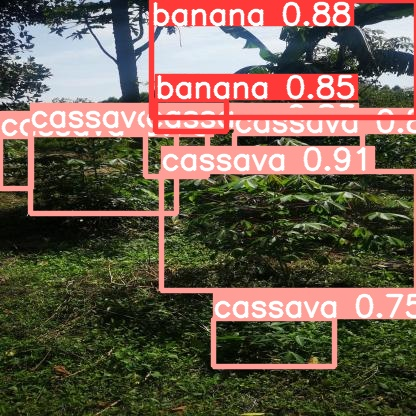

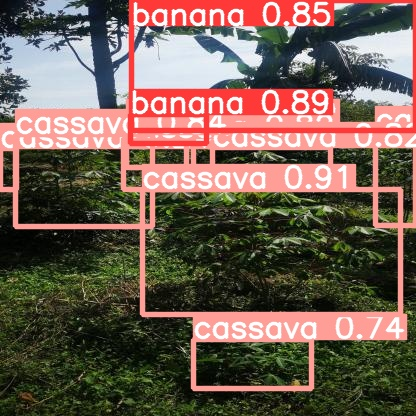

...

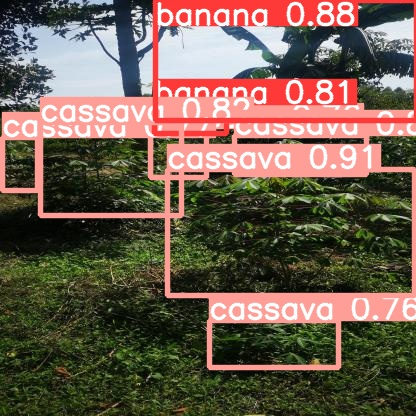

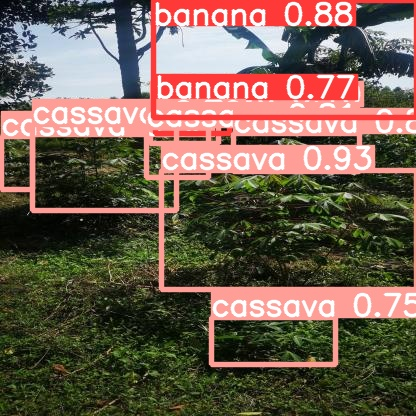

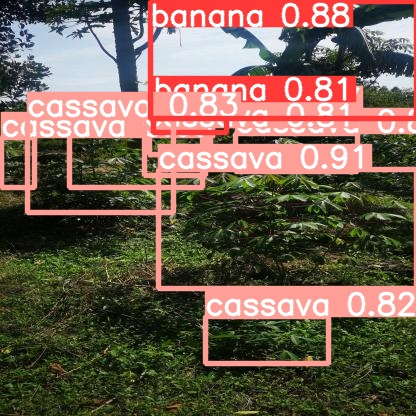

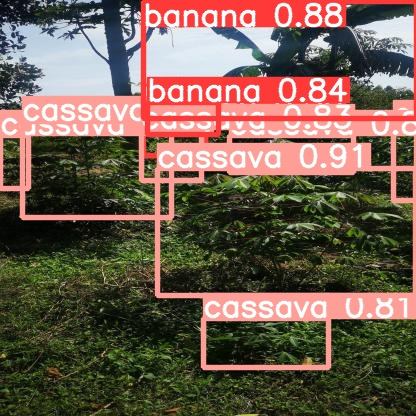

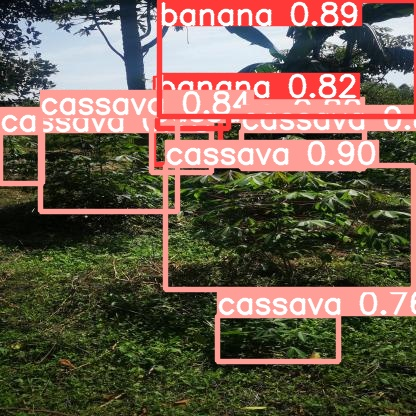

In [11]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")